In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("train.csv")

In [3]:
df.sample(6)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
5153,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9741,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17012,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41905,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
34914,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18722,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(42000, 785)

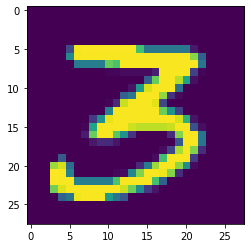

In [5]:
plt.imshow(df.iloc[41763,1:].values.reshape(28,28))

In [6]:
x = df.drop(['label'],axis=1)
y = df['label']

In [7]:
from sklearn.model_selection import train_test_split

x_train , x_test , y_train , y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [8]:
x_train.shape , x_test.shape

((33600, 784), (8400, 784))

In [9]:
from sklearn.neighbors import KNeighborsClassifier

In [10]:
knn = KNeighborsClassifier()

knn.fit(x_train,y_train)

KNeighborsClassifier()

In [11]:
import time 
start = time.time()
y_pred = knn.predict(x_test)
print(time.time() - start)

28.56912326812744


In [12]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test , y_pred)

0.9648809523809524

In [13]:
# Now we use PCA 

In [14]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

In [15]:
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [16]:
#PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [17]:
x_train_trf = pca.fit_transform(x_train)
x_test_trf  = pca.transform(x_test)

In [18]:
x_train_trf.shape , x_test_trf.shape

((33600, 200), (8400, 200))

In [19]:
knn = KNeighborsClassifier()

In [20]:
knn.fit(x_train_trf,y_train)

KNeighborsClassifier()

In [21]:
y_pred1 = knn.predict(x_test_trf)

In [22]:
accuracy_score(y_test,y_pred)

0.9648809523809524

In [23]:
for i in range(1,10):
    pca = PCA(n_components=i)
    x_train_trf = pca.fit_transform(x_train)
    x_test_trf  = pca.transform(x_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(x_train_trf,y_train)
    
    y_pred = knn.predict(x_test_trf)
    
    print(accuracy_score(y_test,y_pred))

0.2577380952380952
0.3244047619047619
0.5103571428571428
0.6661904761904762
0.7382142857142857
0.8228571428571428
0.8432142857142857
0.871904761904762
0.8861904761904762


In [24]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [25]:
x_train_trf

array([[-2.71853075, -0.48946089],
       [-0.67684773, -6.75304372],
       [-3.0332478 ,  6.51008348],
       ...,
       [ 2.14877243,  0.78089996],
       [ 1.05963371,  0.94765209],
       [17.70264942,  1.96188233]])

In [26]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=x_train_trf[:,0],
                 y=x_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [31]:
# transforming in 3D
pca = PCA(n_components=3)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [32]:
x_train_trf

array([[-2.71858026, -0.49032177,  1.13594143],
       [-0.67695825, -6.75383815, -2.33579841],
       [-3.03329607,  6.51035299,  7.49147042],
       ...,
       [ 2.14878969,  0.78117582, -0.74772187],
       [ 1.05959691,  0.9473979 ,  3.9499915 ],
       [17.70262345,  1.96159446, -4.94316918]])

In [33]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=x_train_trf[:,0], y=x_train_trf[:,1], z=x_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()


In [34]:
# eigen values.
pca.explained_variance_

array([40.67111197, 29.17023381, 26.74459609])

In [35]:
# eigen vectors.
pca.components_.shape

(3, 784)

In [36]:
# Finding Optimum Number of PCA.

In [37]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701])

In [39]:
pca = PCA(n_components=784)
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [40]:
pca.explained_variance_

array([4.06711120e+01, 2.91702340e+01, 2.67445962e+01, 2.08534479e+01,
       1.81489188e+01, 1.58529825e+01, 1.38710810e+01, 1.24805897e+01,
       1.10279424e+01, 1.00958253e+01, 9.63317821e+00, 8.62785945e+00,
       8.06303131e+00, 7.89511749e+00, 7.44167929e+00, 7.17032873e+00,
       6.73266373e+00, 6.62744023e+00, 6.41499161e+00, 6.25808269e+00,
       5.90495742e+00, 5.76521585e+00, 5.52084601e+00, 5.32003847e+00,
       5.18309925e+00, 4.93439597e+00, 4.90652171e+00, 4.71800493e+00,
       4.49824444e+00, 4.43140305e+00, 4.32604521e+00, 4.23491831e+00,
       4.10335015e+00, 4.06731180e+00, 4.02362178e+00, 3.84130473e+00,
       3.81886146e+00, 3.71316498e+00, 3.60918108e+00, 3.47303214e+00,
       3.42842989e+00, 3.38841159e+00, 3.29157511e+00, 3.22927379e+00,
       3.21745142e+00, 3.15810372e+00, 3.12620905e+00, 3.10412385e+00,
       3.05892795e+00, 3.03728188e+00, 2.96540461e+00, 2.94033669e+00,
       2.86828564e+00, 2.82617865e+00, 2.80038441e+00, 2.77411221e+00,
      

In [41]:
pca.components_.shape

(784, 784)

In [42]:
pca.explained_variance_ratio_

array([5.78519225e-02, 4.14926968e-02, 3.80423901e-02, 2.96626277e-02,
       2.58156168e-02, 2.25498018e-02, 1.97306802e-02, 1.77527998e-02,
       1.56865066e-02, 1.43606328e-02, 1.37025484e-02, 1.22725500e-02,
       1.14691200e-02, 1.12302739e-02, 1.05852885e-02, 1.01993106e-02,
       9.57676152e-03, 9.42708817e-03, 9.12489429e-03, 8.90170190e-03,
       8.39940495e-03, 8.20063196e-03, 7.85303229e-03, 7.56739707e-03,
       7.37261022e-03, 7.01884653e-03, 6.97919728e-03, 6.71104483e-03,
       6.39845030e-03, 6.30337291e-03, 6.15350848e-03, 6.02388659e-03,
       5.83673972e-03, 5.78547759e-03, 5.72333148e-03, 5.46399774e-03,
       5.43207369e-03, 5.28172755e-03, 5.13381744e-03, 4.94015474e-03,
       4.87671103e-03, 4.81978768e-03, 4.68204430e-03, 4.59342487e-03,
       4.57660834e-03, 4.49219022e-03, 4.44682221e-03, 4.41540749e-03,
       4.35111936e-03, 4.32032928e-03, 4.21808870e-03, 4.18243127e-03,
       4.07994349e-03, 4.02004913e-03, 3.98335855e-03, 3.94598812e-03,
      

In [45]:
np.cumsum(pca.explained_variance_ratio_)*100

array([  5.78519225,   9.93446193,  13.73870094,  16.70496371,
        19.2865254 ,  21.54150558,  23.5145736 ,  25.28985357,
        26.85850424,  28.29456752,  29.66482235,  30.89207736,
        32.03898935,  33.16201674,  34.22054559,  35.24047664,
        36.1981528 ,  37.14086161,  38.05335104,  38.94352123,
        39.78346173,  40.60352492,  41.38882815,  42.14556786,
        42.88282888,  43.58471353,  44.28263326,  44.95373775,
        45.59358278,  46.22392007,  46.83927092,  47.44165957,
        48.02533355,  48.6038813 ,  49.17621445,  49.72261423,
        50.2658216 ,  50.79399435,  51.30737609,  51.80139157,
        52.28906267,  52.77104144,  53.23924587,  53.69858836,
        54.15624919,  54.60546821,  55.05015043,  55.49169118,
        55.92680312,  56.35883605,  56.78064492,  57.19888804,
        57.60688239,  58.00888731,  58.40722316,  58.80182197,
        59.18869358,  59.57188877,  59.94844139,  60.32263485,
        60.68748701,  61.04828955,  61.402176  ,  61.75

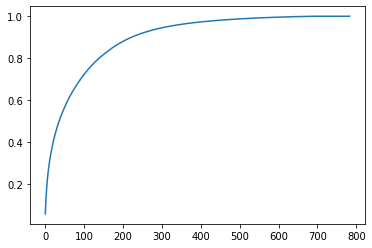

In [46]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [47]:
# The End .